# Appendix Figures

This notebook generates Appendix figures from the paper.

In [1]:
%load_ext autoreload
%autoreload 2

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.lines import Line2D

import viz_utils
import data_utils

pd.set_option('display.max_columns', None)

mpl.rc('image', cmap='viridis')
plt.ion()
normal_font = {'family' : 'DejaVu Sans',
        'weight' : 'medium',
        'size'   : 6}
stats_font = {'family' : 'DejaVu Sans',
        'weight' : 'medium',
        'size'   : 6}
plt.rc('font', **normal_font)

fig_path = ""

print('Path to dataset:', data_utils.butter_data_path())

Path to dataset: s3://oedi-data-lake/butter


In [2]:
def extract_data(original_df, downsample_epochs=False, grouper='shape'):

    original_df['epoch'] = original_df['test_loss_median'].apply(lambda x: list(range(1, 1 + len(x))))

    epoch_wise_values = ["test_loss_median", "test_loss_avg", "test_loss_stddev", "epoch"]

    df = original_df.explode(epoch_wise_values)

    for value in epoch_wise_values:
        df[value] = df[value].astype("float32")
    df["epoch"] = df["epoch"].astype("int")
    df["depth"] = df["depth"].astype("int")

    #downsample by epoch logarithmically
    if downsample_epochs:
        keep_epochs = np.unique(np.logspace(0,np.log10(3000),100,base=10).astype(int))
        df = df[df["epoch"].isin(keep_epochs)]

    # num_free_parameters is not unique in sizes. Take first experiment
    #df["__param__diff__"] = np.abs(df["num_free_parameters"] - df["size"])
    df = df.sort_values('experiment_id').groupby(['dataset',grouper,'num_free_parameters','epoch']).first().reset_index()
    #df = df.drop('__param__diff__', axis=1)
    return df

def preprocess_variables(df, group_by=[], threshold=2):

    #test_loss_median_processed
    df['test_loss_median_processed'] = df['test_loss_median']

    grouper = df.groupby(group_by)['test_loss_median_processed']
    mins = grouper.transform('min')
    df['test_loss_median_processed'] = -np.log10(np.minimum(threshold,df['test_loss_median_processed'] / mins).astype(float)-(1-1e-1))

    grouper = df.groupby(group_by)['test_loss_median_processed']
    mins = grouper.transform('min')
    maxs = grouper.transform('max')
    df['test_loss_median_processed'] = (df['test_loss_median_processed'] - mins)/(maxs-mins)

    #test_loss_median_processed_nocap
    df['test_loss_median_processed_nocap'] = df['test_loss_median']

    grouper = df.groupby(group_by)['test_loss_median_processed_nocap']
    mins = grouper.transform('min')
    df['test_loss_median_processed_nocap'] = -np.log10(df['test_loss_median_processed_nocap'] / mins).astype(float)-(1-1e-1)

    grouper = df.groupby(group_by)['test_loss_median_processed_nocap']
    mins = grouper.transform('min')
    maxs = grouper.transform('max')
    df['test_loss_median_processed_nocap'] = (df['test_loss_median_processed_nocap'] - mins)/(maxs-mins)
    
    #test_loss_cov
    df['test_loss_cov'] = df['test_loss_stddev']/df['test_loss_avg']

    #test_loss_cov_processed
    df['test_loss_cov_processed'] = np.log1p(10*df['test_loss_cov'])
    grouper = df.groupby(group_by)['test_loss_cov_processed']
    mins = grouper.transform('min')
    maxs = grouper.transform('max')
    df['test_loss_cov_processed'] = (df['test_loss_cov_processed'] - mins)/(maxs-mins)

    return df

In [3]:
columns = [
    "test_loss_median",
    "test_loss_stddev",
    "test_loss_avg",
    "experiment_id",
    "size",
    "num_free_parameters",
    'dataset',
    'epochs',
    'shape',
    'depth',
]

# 1. Slice across shapes

## a. Load Data
Please see README.md for instructions on how to obtain this dataset

In [4]:
filters = [
    ('dataset', 'not in', ['banana','poker']),
    ('shape', 'in', ['exponential','rectangle','trapezoid','rectangle_residual']),
    ('learning_rate', '<=', 0.00011),
    ('learning_rate', '>=', 0.00009),
    ('depth', '==', 3),
    ('label_noise', '==', 0.0),
    ('num_runs', '>=', 20)
]

df = data_utils.read_pandas('primary_sweep_summary', columns=columns, filters=filters)

## b. Extract into long-format dataframe

In [5]:
df = extract_data(df, downsample_epochs=True, grouper='shape')

## c. Preprocess the variables we want to plot

In [6]:
df = preprocess_variables(df, group_by=['dataset'],threshold=10)

## d. Plot the Butter Zone

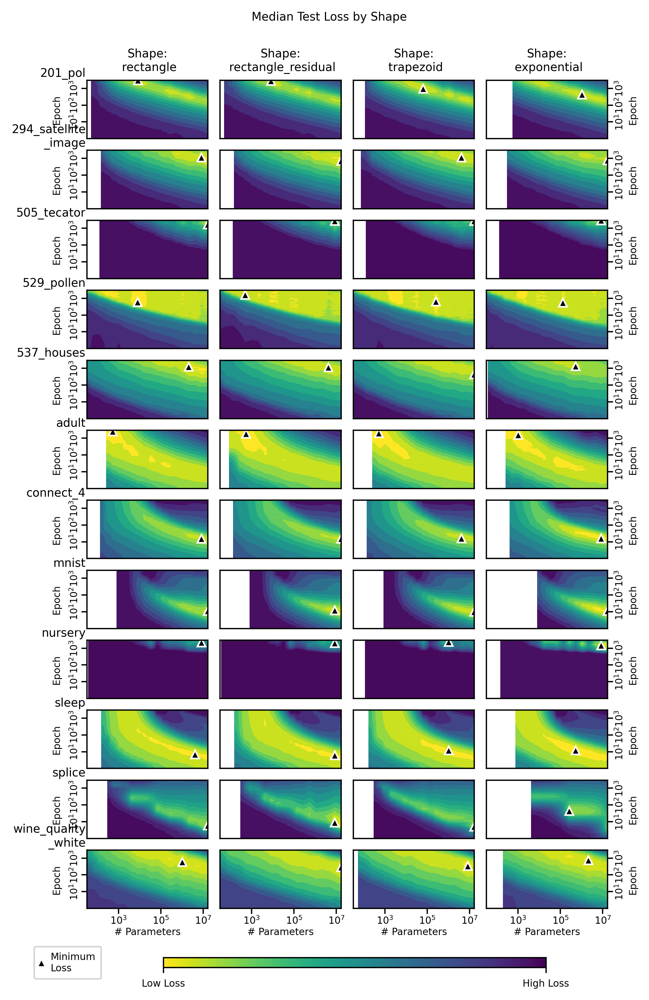

In [7]:
landmarks = []

title = 'Median Test Loss by Shape'
fig = plt.figure(dpi=400, figsize=(5.5,8.5))
viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'shape': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_median_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Shape:\n {x}",
                  plot_landmarks="maximum",
                  landmarks=landmarks,
                  row_label_as_title=True,
                  grid_x_values=['rectangle','rectangle_residual','trapezoid','exponential'])
                  
plt_axs = fig.gca()

plt.subplots_adjust(top=0.93,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="viridis_r"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low Loss', 'High Loss'])

lax = fig.add_axes([0.04, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'shape1_median.png')
plt.show()

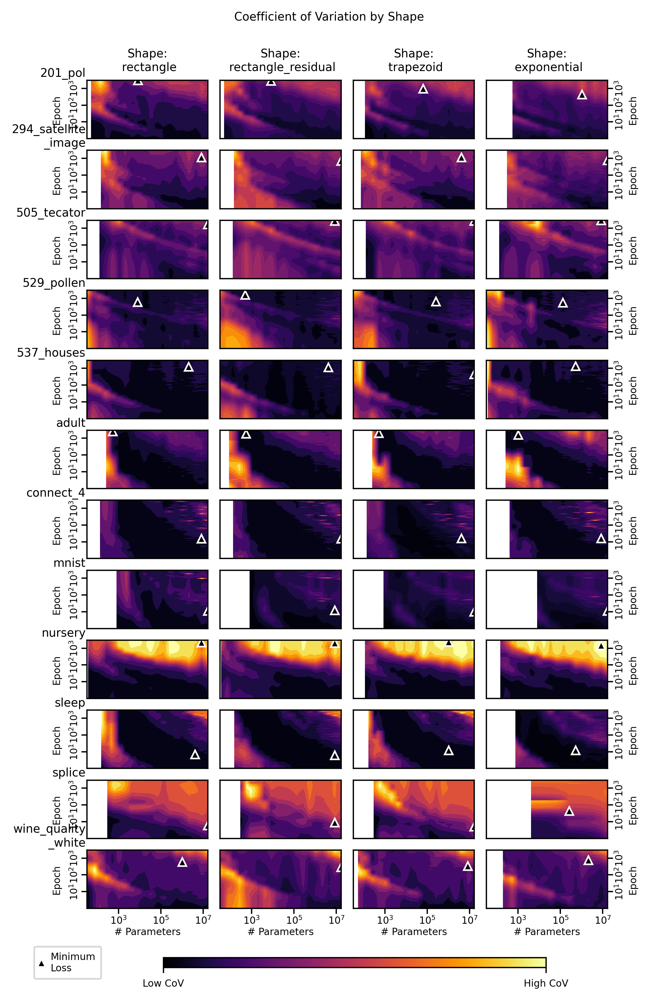

In [8]:
title = 'Coefficient of Variation by Shape'
fig = plt.figure(dpi=400, figsize=(5.5,8.5))
viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'shape': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_cov_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Shape:\n {x}",
                  plot_landmarks="from_list",
                  landmarks=landmarks,
                  row_label_as_title=True,
                  cmap="inferno",
                  grid_x_values=['rectangle','rectangle_residual','trapezoid','exponential'])

plt.subplots_adjust(top=0.93,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="inferno"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low CoV', 'High CoV'])
#plt.subplots_adjust(top=0.96,bottom=0.06)

lax = fig.add_axes([0.04, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'shape1_cov.png')
plt.show()

## e. Load Data
Please see README.md for instructions on how to obtain this dataset

In [9]:
filters = [
    ('dataset', 'not in', ['banana','poker']),
    ('shape', 'in', ['rectangle','wide_first_2x','wide_first_4x','wide_first_8x','wide_first_16x']),
    ('learning_rate', '<=', 0.00011),
    ('learning_rate', '>=', 0.00009),
    ('depth', '==', 3),
    ('label_noise', '==', 0.0),
    ('num_runs', '>=', 20)
]

df = data_utils.read_pandas('primary_sweep_summary', columns=columns, filters=filters)

## f. Extract into long-format dataframe

In [10]:
df = extract_data(df, downsample_epochs=True, grouper='shape')

## g. Preprocess the variables we want to plot

In [11]:
df = preprocess_variables(df, group_by=['dataset'],threshold=10)

## h. Plot the Butter Zone

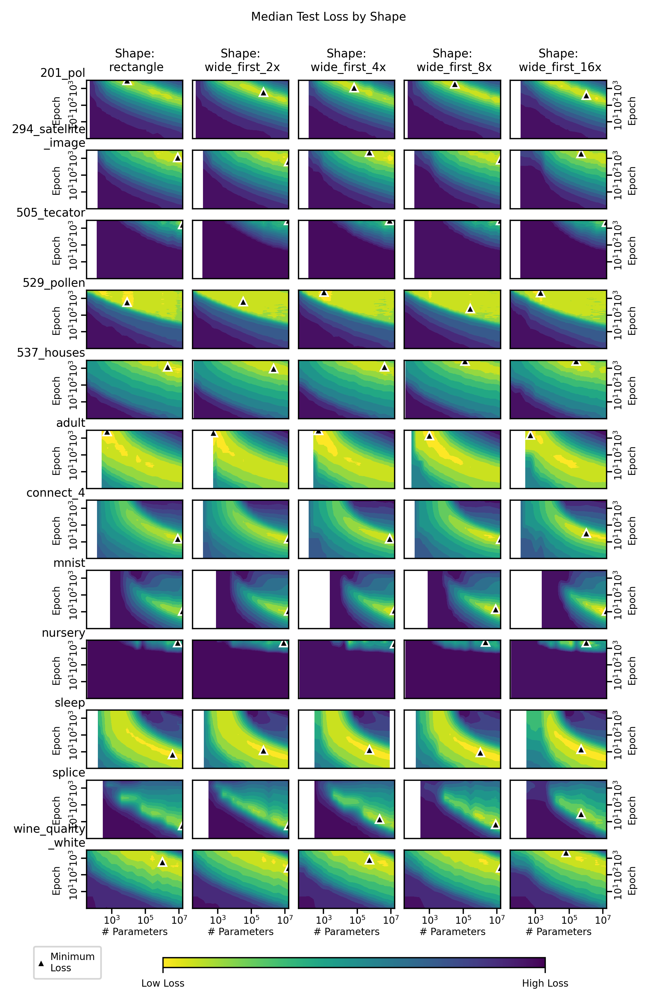

In [12]:
landmarks = []

title = 'Median Test Loss by Shape'
fig = plt.figure(dpi=400, figsize=(5.5,8.5))
viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'shape': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_median_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Shape:\n {x}",
                  plot_landmarks="maximum",
                  landmarks=landmarks,
                  row_label_as_title=True,
                  grid_x_values=['rectangle','wide_first_2x','wide_first_4x','wide_first_8x','wide_first_16x'])
                  
plt_axs = fig.gca()

plt.subplots_adjust(top=0.93,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="viridis_r"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low Loss', 'High Loss'])

lax = fig.add_axes([0.04, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'shape2_median.png')
plt.show()

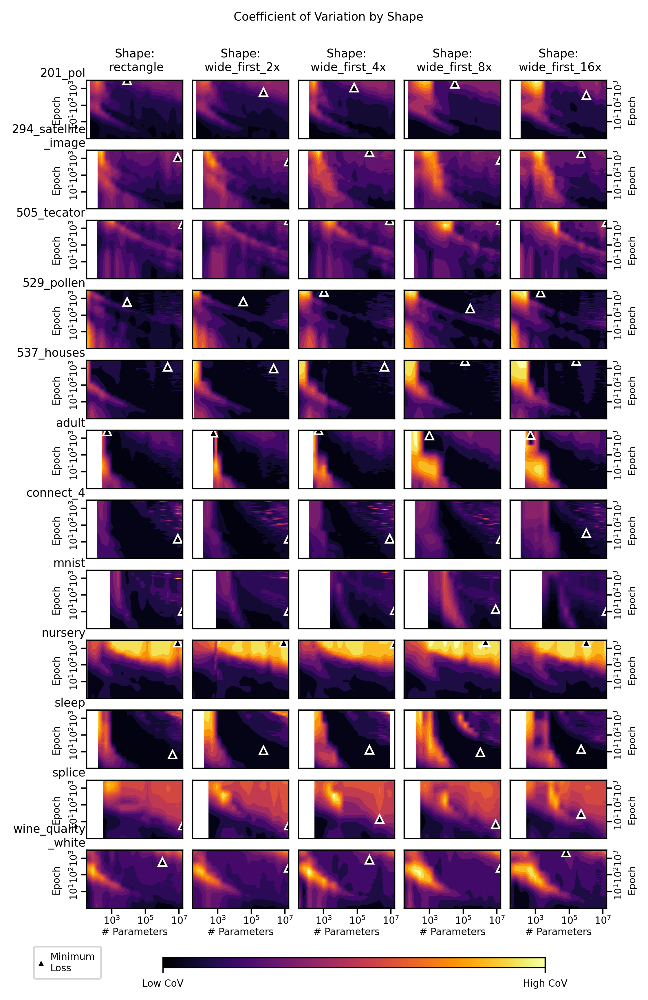

In [13]:
title = 'Coefficient of Variation by Shape'
fig = plt.figure(dpi=400, figsize=(5.5,8.5))
viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'shape': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_cov_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Shape:\n {x}",
                  plot_landmarks="from_list",
                  landmarks=landmarks,
                  row_label_as_title=True,
                  cmap="inferno",
                  grid_x_values=['rectangle','wide_first_2x','wide_first_4x','wide_first_8x','wide_first_16x'])

plt.subplots_adjust(top=0.93,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="inferno"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low CoV', 'High CoV'])
#plt.subplots_adjust(top=0.96,bottom=0.06)

lax = fig.add_axes([0.04, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'shape2_cov.png')
plt.show()

# 2. Slice across depths

## a. Load Data
Please see README.md for instructions on how to obtain this dataset

In [14]:
filters = [
    ('dataset', 'not in', ['banana','poker']),
    ('shape', '==', 'rectangle'),
    ('learning_rate', '<=', 0.00011),
    ('learning_rate', '>=', 0.00009),
    ('depth', 'in', [2,3,4,5,6,7]),
    ('label_noise', '==', 0.0),
    ('num_runs', '>=', 20)
]

df = data_utils.read_pandas('primary_sweep_summary', columns=columns, filters=filters)

## b. Extract into long-format dataframe

In [15]:
df = extract_data(df, downsample_epochs=True, grouper='depth')

## c. Preprocess the variables we want to plot

In [16]:
df = preprocess_variables(df, group_by=['dataset'],threshold=10)

## d. Plot the Butter Zone

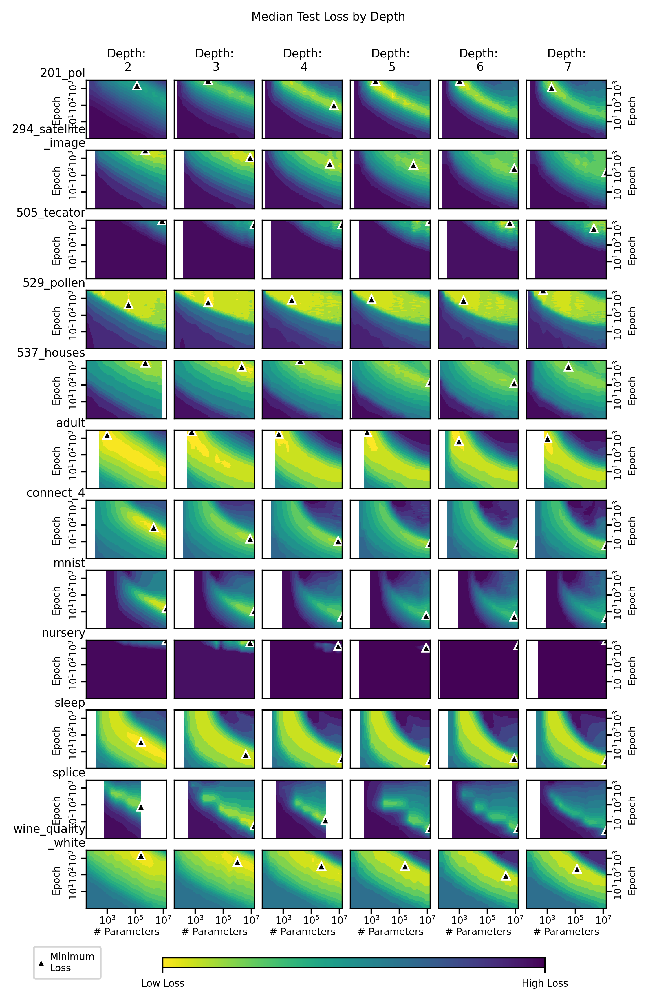

In [17]:
landmarks = []

title = 'Median Test Loss by Depth'
fig = plt.figure(dpi=400, figsize=(5.5,8.5))
viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'depth': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_median_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Depth:\n {x}",
                  plot_landmarks="maximum",
                  landmarks=landmarks,
                  row_label_as_title=True)
                  
plt_axs = fig.gca()

plt.subplots_adjust(top=0.93,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="viridis_r"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low Loss', 'High Loss'])

lax = fig.add_axes([0.04, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'depth1_median.png')
plt.show()

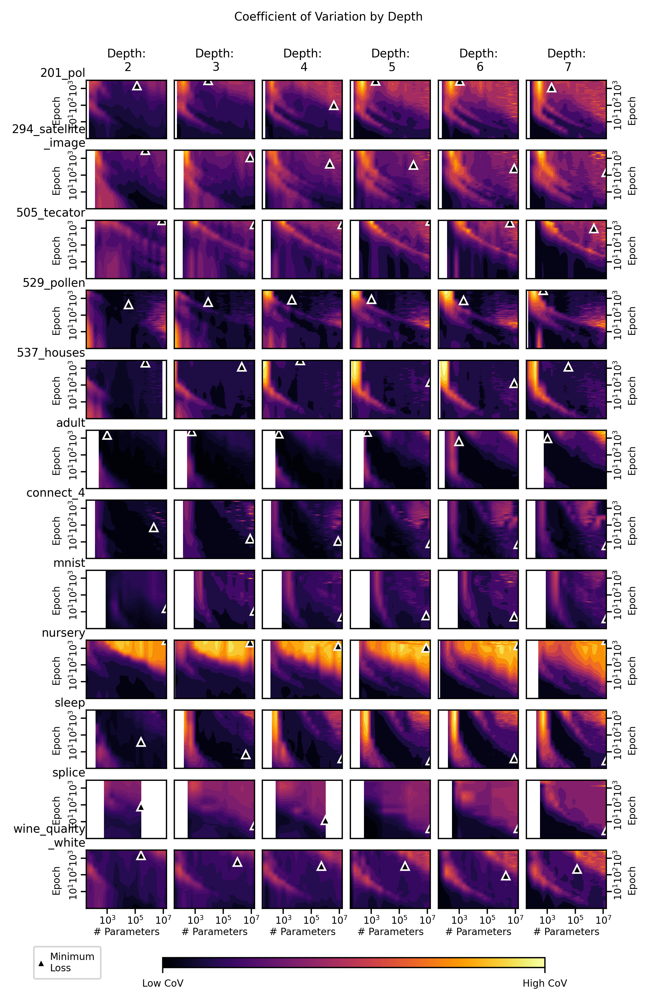

In [18]:
title = 'Coefficient of Variation by Depth'
fig = plt.figure(dpi=400, figsize=(5.5,8.5))
viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'depth': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_cov_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Depth:\n {x}",
                  plot_landmarks="from_list",
                  landmarks=landmarks,
                  row_label_as_title=True,
                  cmap="inferno",)

plt.subplots_adjust(top=0.93,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="inferno"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low CoV', 'High CoV'])
#plt.subplots_adjust(top=0.96,bottom=0.06)

lax = fig.add_axes([0.04, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'depth1_cov.png')
plt.show()

## e. Load Data
Please see README.md for instructions on how to obtain this dataset

In [19]:
filters = [
    ('dataset', 'not in', ['banana','poker']),
    ('shape', '==', 'rectangle'),
    ('learning_rate', '<=', 0.00011),
    ('learning_rate', '>=', 0.00009),
    ('depth', 'in', [2,8,12,16,20]),
    ('label_noise', '==', 0.0),
    ('num_runs', '>=', 20)
]

df = data_utils.read_pandas('primary_sweep_summary', columns=columns, filters=filters)

## f. Extract into long-format dataframe

In [20]:
df = extract_data(df, downsample_epochs=True, grouper='depth')

## g. Preprocess the variables we want to plot

In [21]:
df = preprocess_variables(df, group_by=['dataset'],threshold=10)

## h. Plot the Butter Zone

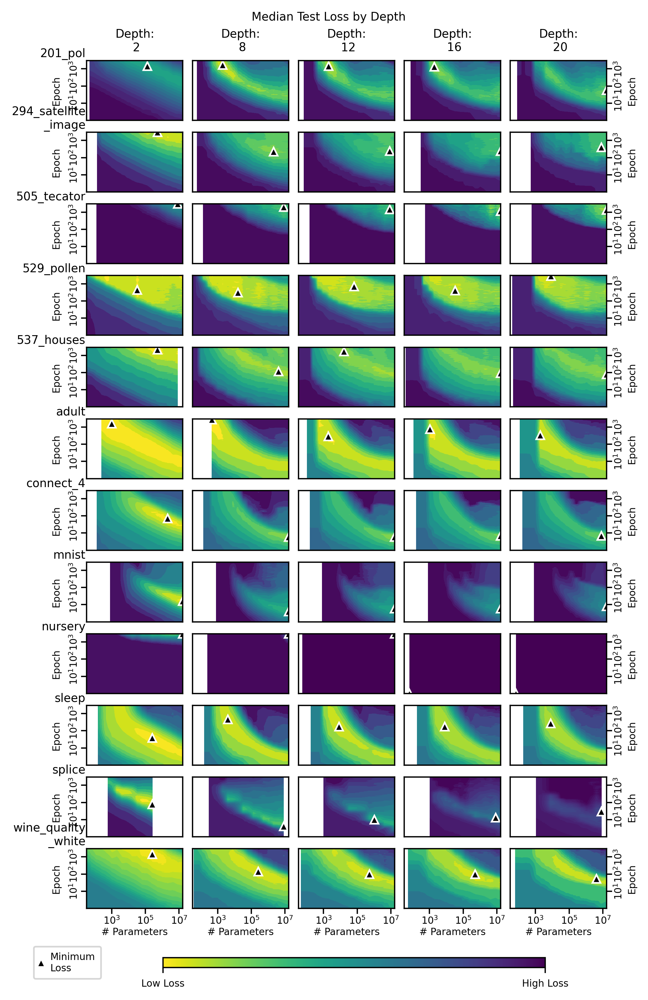

In [22]:
landmarks = []

title = 'Median Test Loss by Depth'
fig = plt.figure(dpi=400, figsize=(5.5,8.5))
viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'depth': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_median_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Depth:\n {x}",
                  plot_landmarks="maximum",
                  landmarks=landmarks,
                  row_label_as_title=True)
                  
plt_axs = fig.gca()

plt.subplots_adjust(top=0.95,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="viridis_r"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low Loss', 'High Loss'])

lax = fig.add_axes([0.04, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'depth2_median.png')
plt.show()

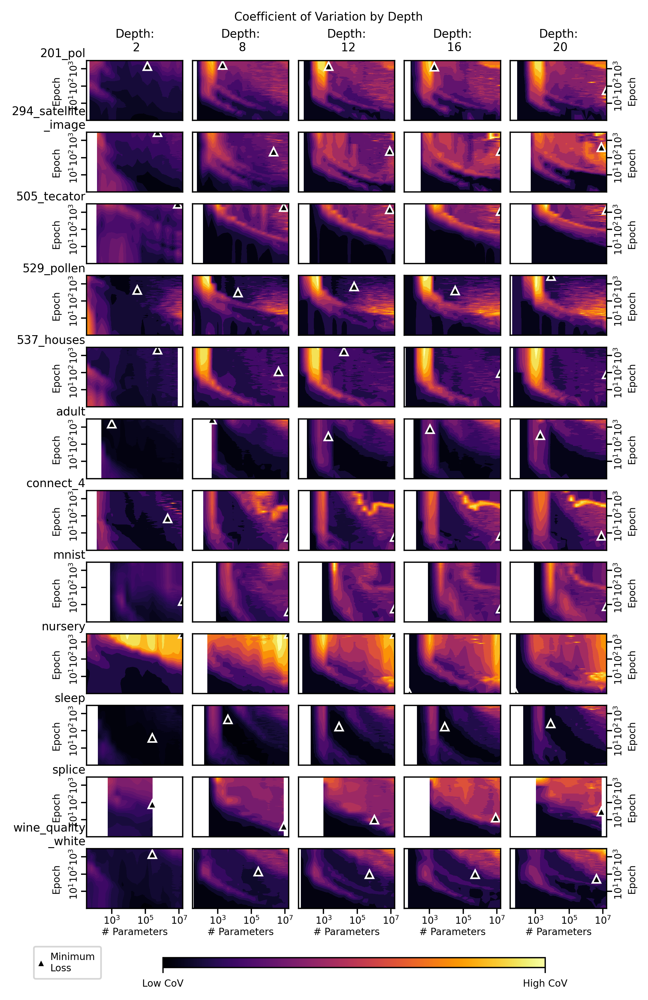

In [23]:
title = 'Coefficient of Variation by Depth'
fig = plt.figure(dpi=400, figsize=(5.5,8.5))
viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'depth': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_cov_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Depth:\n {x}",
                  plot_landmarks="from_list",
                  landmarks=landmarks,
                  row_label_as_title=True,
                  cmap="inferno",)

plt.subplots_adjust(top=0.95,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="inferno"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low CoV', 'High CoV'])
#plt.subplots_adjust(top=0.96,bottom=0.06)

lax = fig.add_axes([0.04, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'depth2_cov.png')
plt.show()

# 3. Slice across learning rates

## a. Load Data
Please see README.md for instructions on how to obtain this dataset

In [24]:
filters = [
    ('dataset', 'in', ['201_pol','529_pollen','537_houses','connect_4','mnist','sleep','wine_quality_white']),
    ('shape', '==', 'rectangle'),
    ('depth', '==', 3)
]

columns = [
    "test_loss_median",
    "test_loss_stddev",
    "test_loss_avg",
    "experiment_id",
    "size",
    "num_free_parameters",
    'dataset',
    'epochs',
    'shape',
    'depth',
    'learning_rate',
]

df = data_utils.read_pandas('learning_rate_sweep_summary', columns=columns, filters=filters)

## b. Extract into long-format dataframe

In [25]:
df = extract_data(df, downsample_epochs=True, grouper='learning_rate')

## c. Preprocess the variables we want to plot

In [26]:
df = preprocess_variables(df, group_by=['dataset'])

## d. Plot the Butter Zone

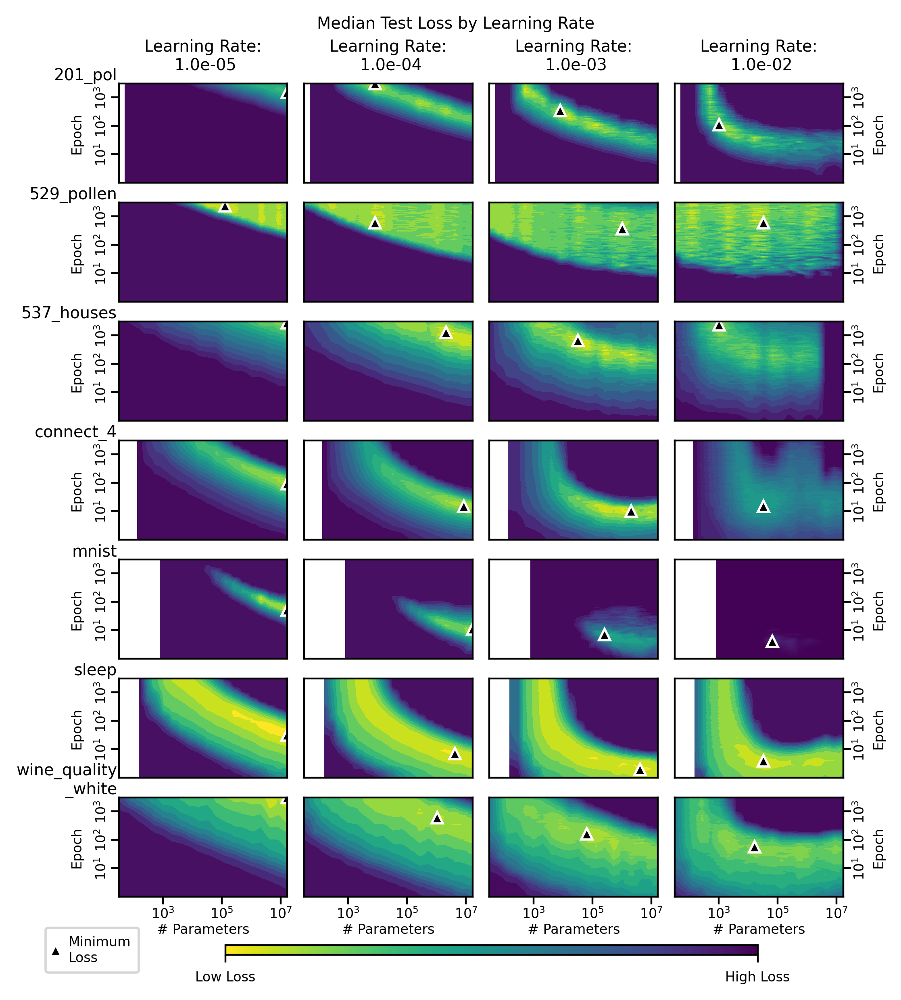

In [27]:
landmarks = []

df['learning_rate'] = df['learning_rate'].astype('float32')

title = 'Median Test Loss by Learning Rate'
fig = plt.figure(dpi=400, figsize=(5.5,6))
viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'learning_rate': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_median_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Learning Rate:\n {x:.1e}",
                  plot_landmarks="maximum",
                  landmarks=landmarks,
                  row_label_as_title=True)
                  
plt_axs = fig.gca()

plt.subplots_adjust(top=0.93,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="viridis_r"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low Loss', 'High Loss'])

lax = fig.add_axes([0.04, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'lr_median.png')
plt.show()

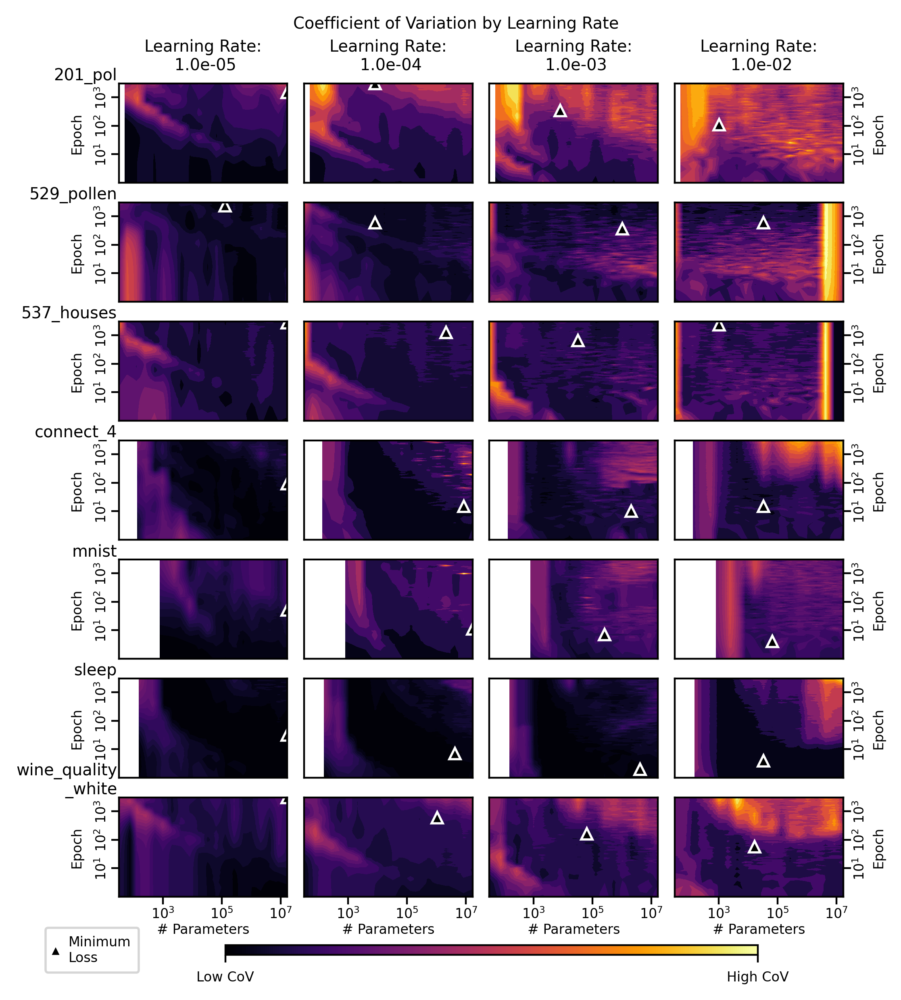

In [28]:
title = 'Coefficient of Variation by Learning Rate'
fig = plt.figure(dpi=400, figsize=(5.5,6))
viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'learning_rate': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_cov_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Learning Rate:\n {x:.1e}",
                  plot_landmarks="from_list",
                  landmarks=landmarks,
                  row_label_as_title=True,
                  cmap="inferno",)

plt.subplots_adjust(top=0.93,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="inferno"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low CoV', 'High CoV'])
#plt.subplots_adjust(top=0.96,bottom=0.06)

lax = fig.add_axes([0.04, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'lr_cov.png')
plt.show()

# 4. Slice across batch sizes

## a. Load Data
Please see README.md for instructions on how to obtain this dataset

In [29]:
filters = [
    ('dataset', 'in', ['201_pol','529_pollen','537_houses','connect_4','mnist','sleep','wine_quality_white']),
    ('shape', '==', 'rectangle'),
    ('depth', '==', 3)
]

columns = [
    "test_loss_median",
    "test_loss_stddev",
    "test_loss_avg",
    "experiment_id",
    "size",
    "num_free_parameters",
    'dataset',
    'epochs',
    'shape',
    'depth',
    'batch_size',
]

df = data_utils.read_pandas('batch_size_sweep_summary', columns=columns, filters=filters)

## b. Extract into long-format dataframe

In [30]:
df = extract_data(df, downsample_epochs=True, grouper='batch_size')

## c. Preprocess the variables we want to plot

In [31]:
df = preprocess_variables(df, group_by=['dataset'])

## d. Plot the Butter Zone

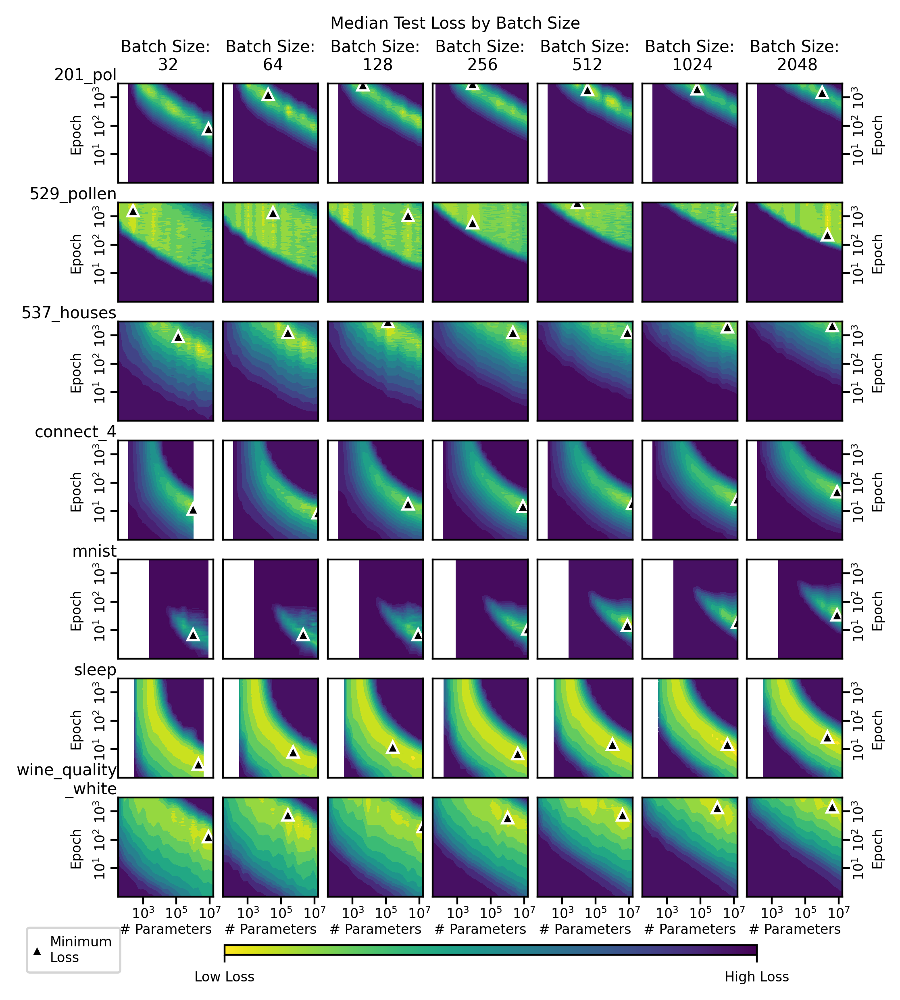

In [32]:
landmarks = []

title = 'Median Test Loss by Batch Size'
fig = plt.figure(dpi=400, figsize=(5.5,6))
viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'batch_size': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_median_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Batch Size:\n {x}",
                  plot_landmarks="maximum",
                  landmarks=landmarks,
                  row_label_as_title=True)
                  
plt_axs = fig.gca()

plt.subplots_adjust(top=0.93,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="viridis_r"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low Loss', 'High Loss'])

lax = fig.add_axes([0.02, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'batch_size_median.png')
plt.show()

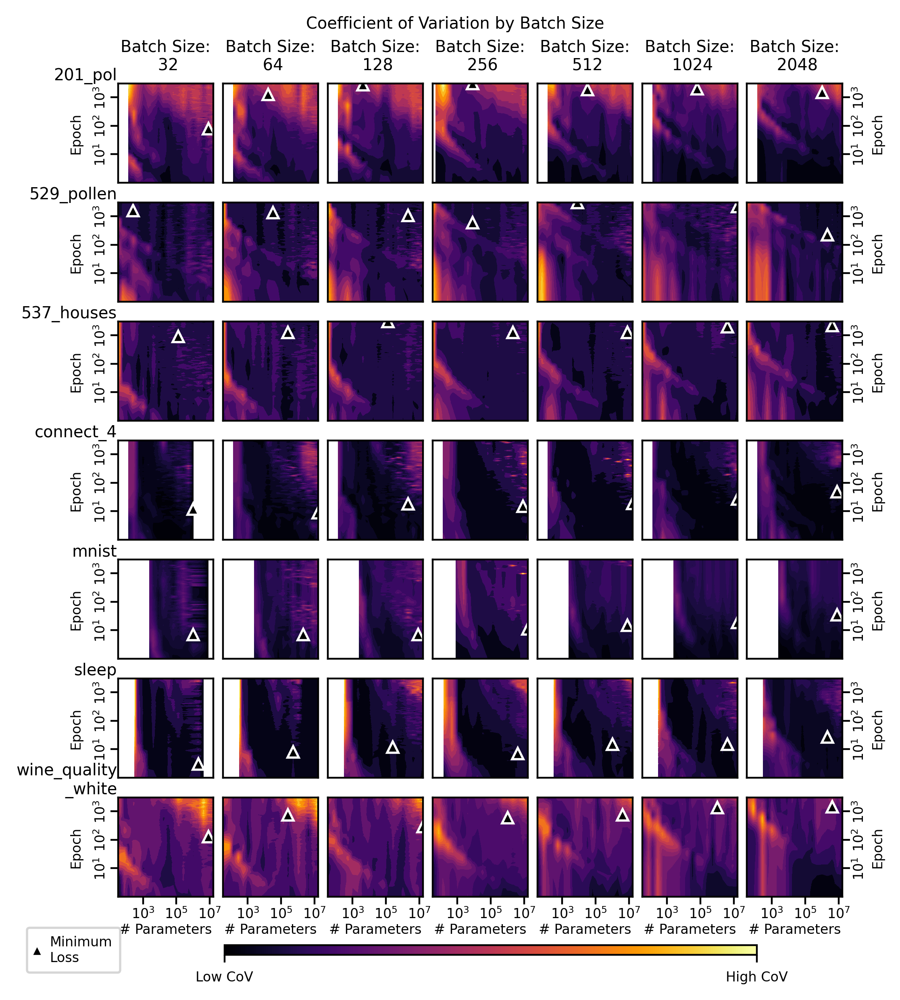

In [33]:
title = 'Coefficient of Variation by Batch Size'
fig = plt.figure(dpi=400, figsize=(5.5,6))

df.loc[df['test_loss_cov_processed'].isna(),'test_loss_cov_processed']=0

viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'batch_size': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_cov_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Batch Size:\n {x}",
                  plot_landmarks="from_list",
                  landmarks=landmarks,
                  row_label_as_title=True,
                  cmap="inferno",)

plt.subplots_adjust(top=0.93,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="inferno"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low CoV', 'High CoV'])
#plt.subplots_adjust(top=0.96,bottom=0.06)

lax = fig.add_axes([0.02, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'batch_size_cov.png')
plt.show()

# 5. Slice across L1 regularization levels

## a. Load Data
Please see README.md for instructions on how to obtain this dataset

In [34]:
regularization_filters = [
    ('dataset', 'in', ['201_pol','529_pollen','537_houses','connect_4','mnist','sleep','wine_quality_white']),
    ('shape', '==', 'rectangle'),
    ('depth', '==', 3),
    ('kernel_regularizer.type', '==', 'l1'),
    ('kernel_regularizer.l1', 'in', [3.1250e-04, 6.2500e-04, 1.2500e-03, 2.5000e-03, 5.0000e-03])
]

filters = [
    ('dataset', 'in', ['201_pol','529_pollen','537_houses','connect_4','mnist','sleep','wine_quality_white']),
    ('shape', '==', 'rectangle'),
    ('learning_rate', '<=', 0.00011),
    ('learning_rate', '>=', 0.00009),
    ('depth', '==', 3),
    ('label_noise', '==', 0.0),
    ('num_runs', '>=', 20)
]

columns = [
    "test_loss_median",
    "test_loss_stddev",
    "test_loss_avg",
    "experiment_id",
    "size",
    "num_free_parameters",
    'dataset',
    'epochs',
    'shape',
    'depth',
    'kernel_regularizer.type',
    'kernel_regularizer.l1',
]

df = data_utils.read_pandas('regularization_sweep_summary', columns=columns, filters=regularization_filters)
df = pd.concat([df,data_utils.read_pandas('primary_sweep_summary', columns=columns, filters=filters)])
df.loc[df['kernel_regularizer.l1'].isna(),'kernel_regularizer.l1'] = 0

## b. Extract into long-format dataframe

In [35]:
df = extract_data(df, downsample_epochs=True, grouper='kernel_regularizer.l1')

## c. Preprocess the variables we want to plot

In [36]:
df = preprocess_variables(df, group_by=['dataset'],threshold=10)

## d. Plot the Butter Zone

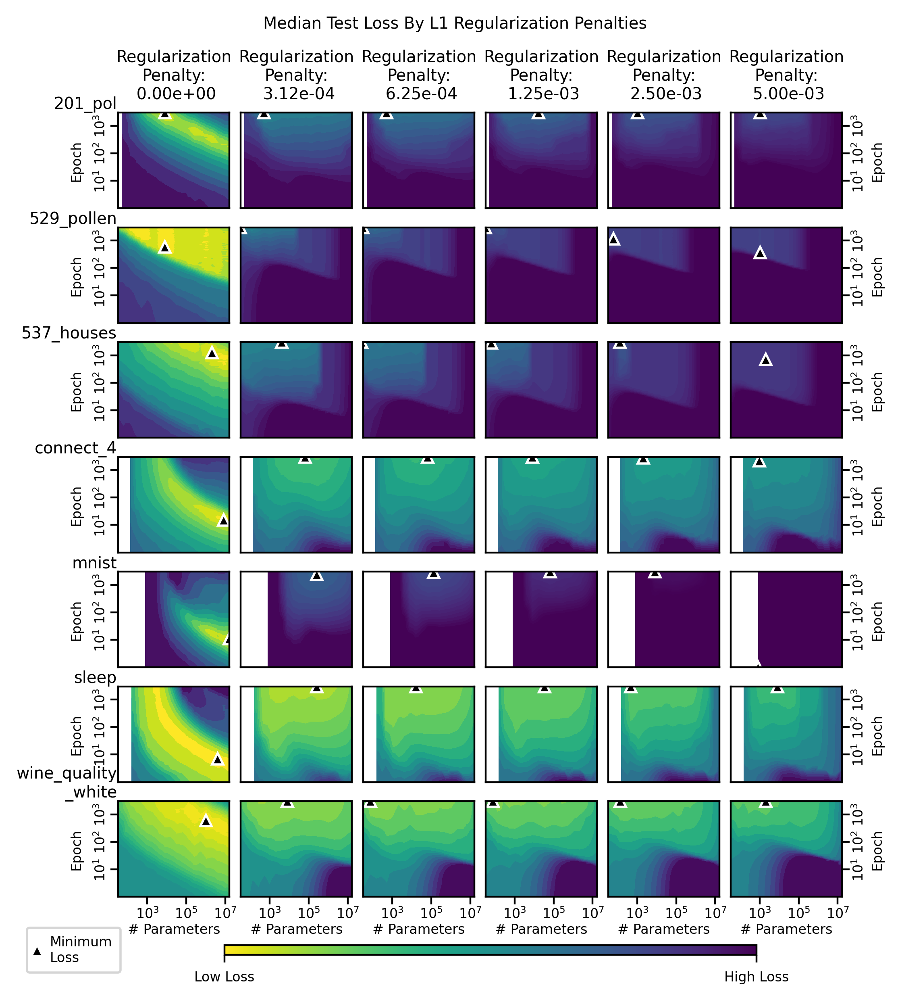

In [37]:
landmarks = []

title = 'Median Test Loss By L1 Regularization Penalties'
fig = plt.figure(dpi=400, figsize=(5.5,6))
viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'kernel_regularizer.l1': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_median_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Regularization\nPenalty:\n {x:.2e}",
                  plot_landmarks="maximum",
                  landmarks=landmarks,
                  row_label_as_title=True)
                  
plt_axs = fig.gca()

plt.subplots_adjust(top=0.90,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="viridis_r"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low Loss', 'High Loss'])

lax = fig.add_axes([0.02, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'l1_median.png')
plt.show()

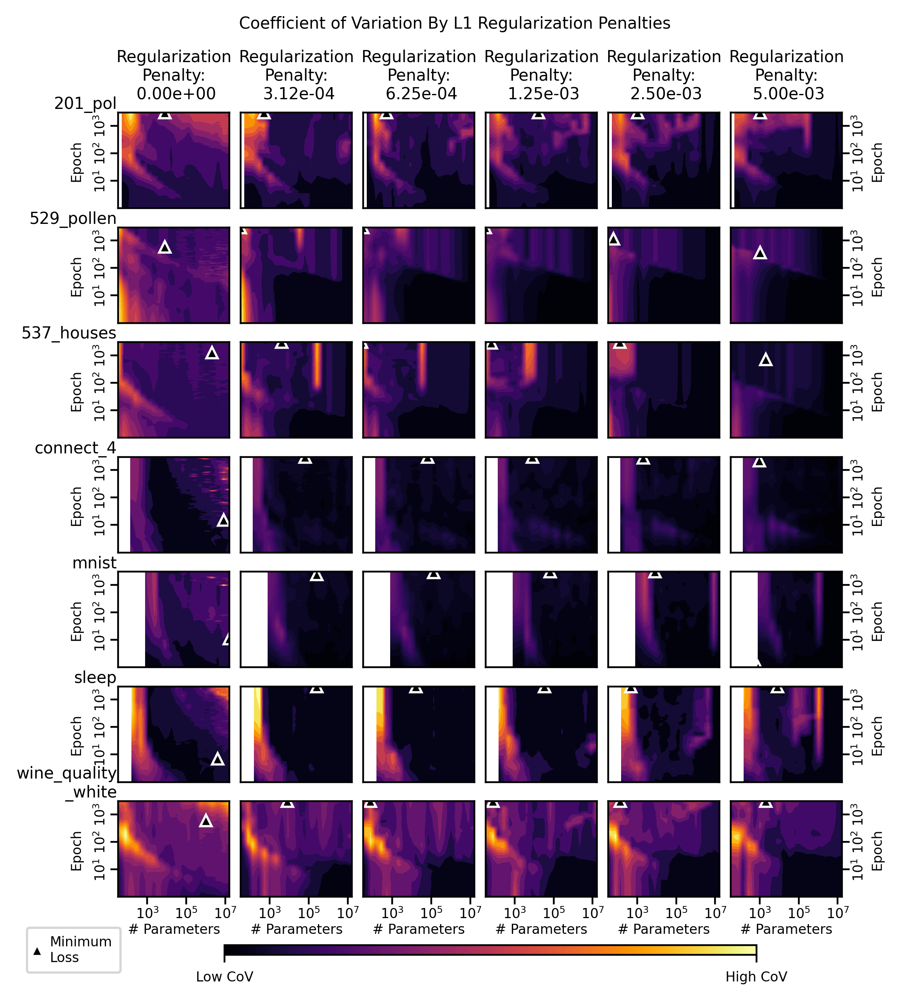

In [38]:
title = 'Coefficient of Variation By L1 Regularization Penalties'
fig = plt.figure(dpi=400, figsize=(5.5,6))

df.loc[df['test_loss_cov_processed'].isna(),'test_loss_cov_processed']=0

viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'kernel_regularizer.l1': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_cov_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Regularization\nPenalty:\n {x:.2e}",
                  plot_landmarks="from_list",
                  landmarks=landmarks,
                  row_label_as_title=True,
                  cmap="inferno",)

plt.subplots_adjust(top=0.90,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="inferno"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low CoV', 'High CoV'])
#plt.subplots_adjust(top=0.96,bottom=0.06)

lax = fig.add_axes([0.02, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'l1_cov.png')
plt.show()

# 6. Slice across L2 regularization levels

## a. Load Data
Please see README.md for instructions on how to obtain this dataset

In [39]:
regularization_filters = [
    ('dataset', 'in', ['201_pol','529_pollen','537_houses','connect_4','mnist','sleep','wine_quality_white']),
    ('shape', '==', 'rectangle'),
    ('depth', '==', 3),
    ('kernel_regularizer.type', '==', 'l2'),
    ('kernel_regularizer.l2', 'in', [1.5625e-04, 3.1250e-04, 6.2500e-04, 1.2500e-03, 2.5000e-03])
]

filters = [
    ('dataset', 'in', ['201_pol','529_pollen','537_houses','connect_4','mnist','sleep','wine_quality_white']),
    ('shape', '==', 'rectangle'),
    ('learning_rate', '<=', 0.00011),
    ('learning_rate', '>=', 0.00009),
    ('depth', '==', 3),
    ('label_noise', '==', 0.0),
    ('num_runs', '>=', 20)
]

columns = [
    "test_loss_median",
    "test_loss_stddev",
    "test_loss_avg",
    "experiment_id",
    "size",
    "num_free_parameters",
    'dataset',
    'epochs',
    'shape',
    'depth',
    'kernel_regularizer.type',
    'kernel_regularizer.l2',
]

df = data_utils.read_pandas('regularization_sweep_summary', columns=columns, filters=regularization_filters)
df = pd.concat([df,data_utils.read_pandas('primary_sweep_summary', columns=columns, filters=filters)])
df.loc[df['kernel_regularizer.l2'].isna(),'kernel_regularizer.l2'] = 0

## b. Extract into long-format dataframe

In [40]:
df = extract_data(df, downsample_epochs=True, grouper='kernel_regularizer.l2')

## c. Preprocess the variables we want to plot

In [41]:
df = preprocess_variables(df, group_by=['dataset'],threshold=10)

## d. Plot the Butter Zone

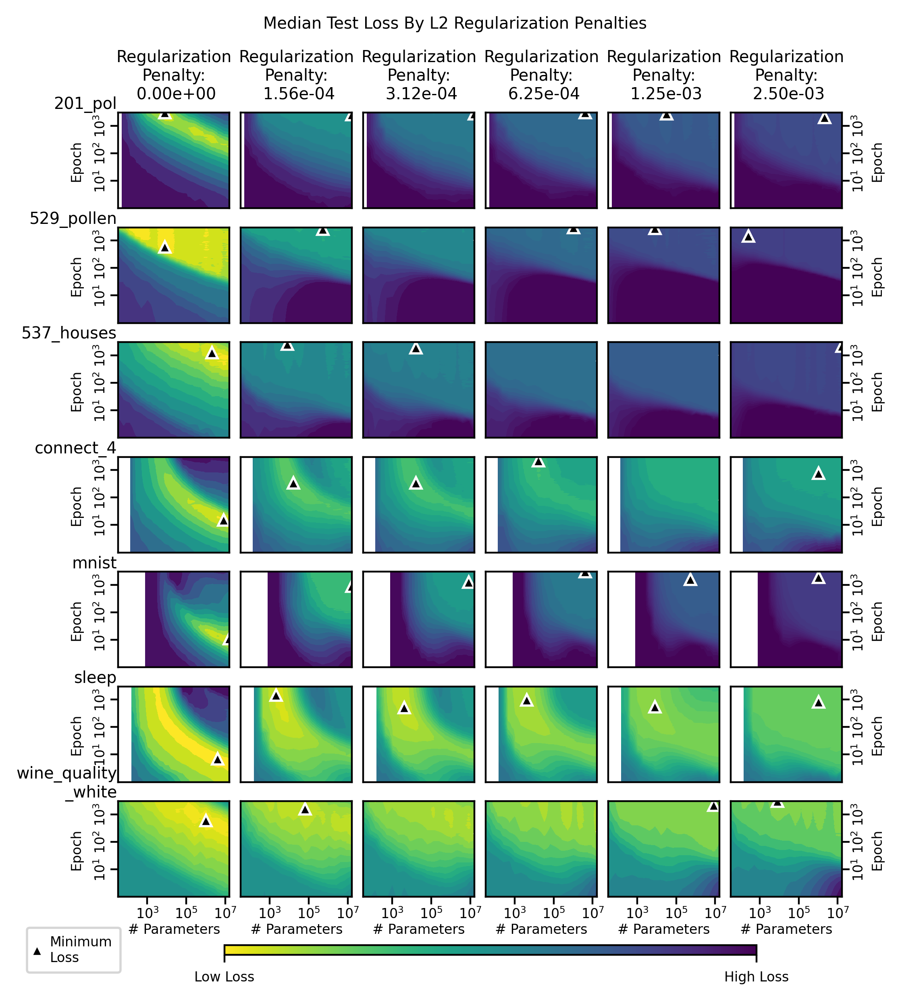

In [42]:
landmarks = []

title = 'Median Test Loss By L2 Regularization Penalties'
fig = plt.figure(dpi=400, figsize=(5.5,6))
viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'kernel_regularizer.l2': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_median_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Regularization\nPenalty:\n {x:.2e}",
                  plot_landmarks="maximum",
                  landmarks=landmarks,
                  row_label_as_title=True)
                  
plt_axs = fig.gca()

plt.subplots_adjust(top=0.90,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="viridis_r"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low Loss', 'High Loss'])

lax = fig.add_axes([0.02, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'l2_median.png')
plt.show()

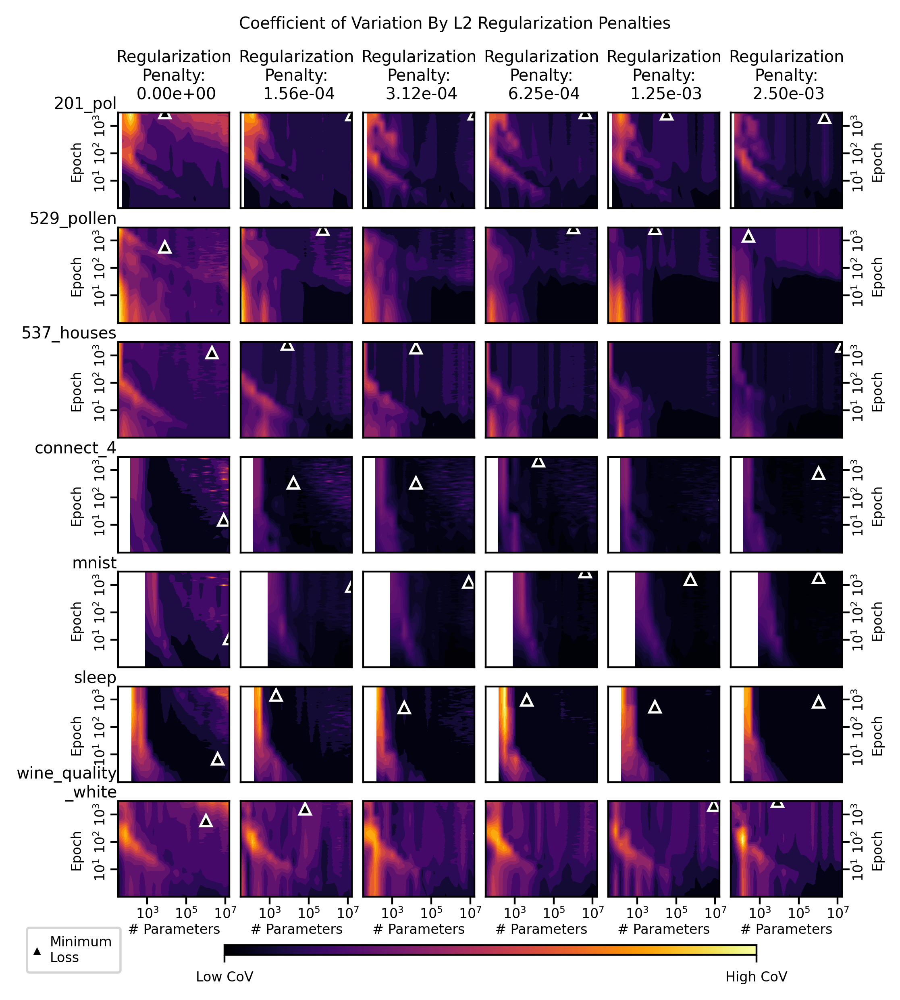

In [43]:
title = 'Coefficient of Variation By L2 Regularization Penalties'
fig = plt.figure(dpi=400, figsize=(5.5,6))

df.loc[df['test_loss_cov_processed'].isna(),'test_loss_cov_processed']=0

viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'kernel_regularizer.l2': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_cov_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Regularization\nPenalty:\n {x:.2e}",
                  plot_landmarks="from_list",
                  landmarks=landmarks,
                  row_label_as_title=True,
                  cmap="inferno",)

plt.subplots_adjust(top=0.90,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="inferno"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low CoV', 'High CoV'])
#plt.subplots_adjust(top=0.96,bottom=0.06)

lax = fig.add_axes([0.02, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'l2_cov.png')
plt.show()

# 7. Slice across label noise levels

## a. Load Data
Please see README.md for instructions on how to obtain this dataset

In [44]:
filters = [
    ('dataset', 'in', ['201_pol','529_pollen','537_houses','connect_4','mnist','sleep','wine_quality_white']),
    ('shape', '==', 'rectangle'),
    ('depth', '==', 3),
    ('learning_rate', '<=', 0.00011),
    ('learning_rate', '>=', 0.00009),
]

columns = [
    "test_loss_median",
    "test_loss_stddev",
    "test_loss_avg",
    "experiment_id",
    "size",
    "num_free_parameters",
    'dataset',
    'epochs',
    'shape',
    'depth',
    'label_noise',
]

df = data_utils.read_pandas('label_noise_sweep_summary', columns=columns, filters=filters)

## b. Extract into long-format dataframe

In [45]:
df = extract_data(df, downsample_epochs=True, grouper='label_noise')

## c. Preprocess the variables we want to plot

In [46]:
df = preprocess_variables(df, group_by=['dataset'])

## d. Plot the Butter Zone

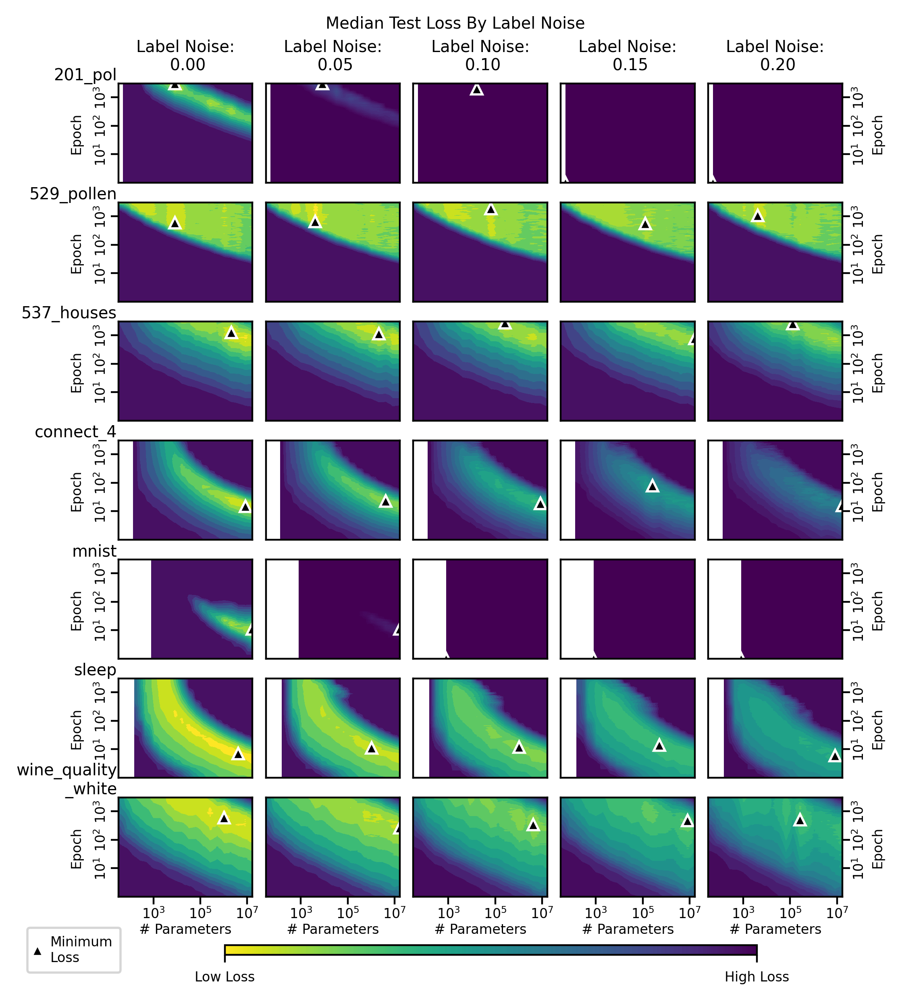

In [47]:
landmarks = []

title = 'Median Test Loss By Label Noise'
fig = plt.figure(dpi=400, figsize=(5.5,6))
viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'label_noise': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_median_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Label Noise:\n {x:.2f}",
                  plot_landmarks="maximum",
                  landmarks=landmarks,
                  row_label_as_title=True)
                  
plt_axs = fig.gca()

plt.subplots_adjust(top=0.93,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="viridis_r"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low Loss', 'High Loss'])

lax = fig.add_axes([0.02, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'label_noise_median.png')
plt.show()

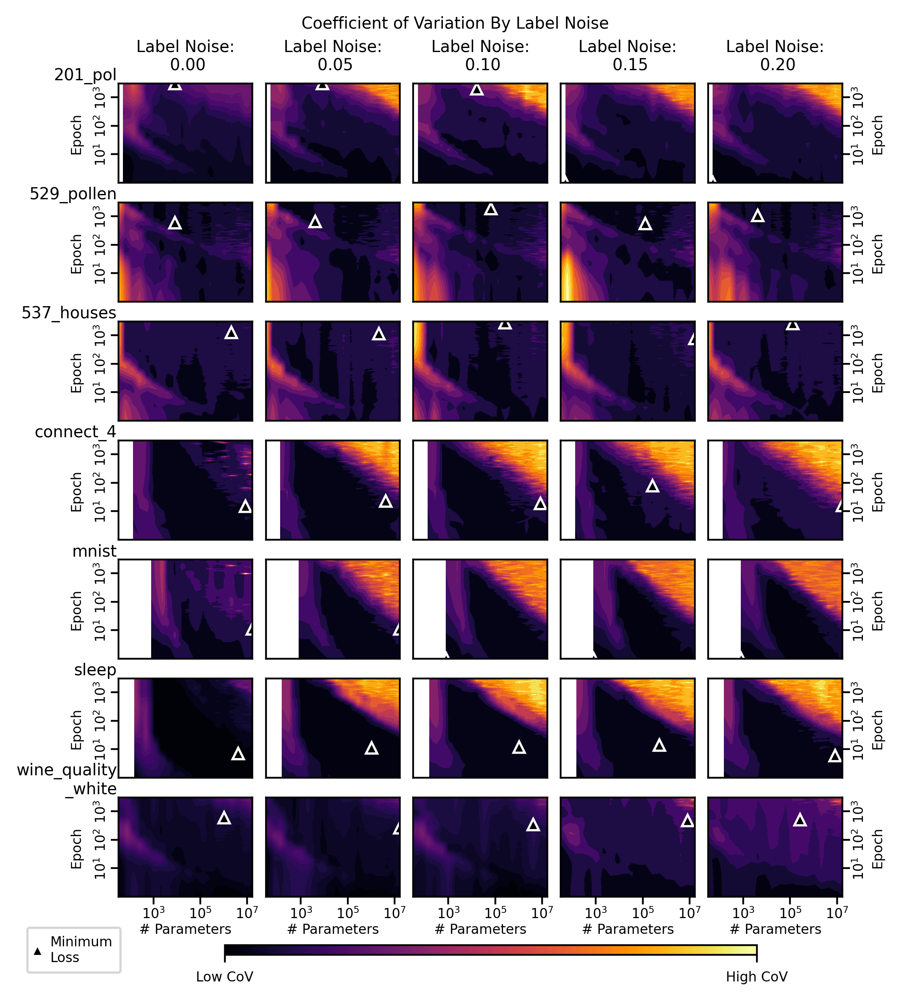

In [48]:
title = 'Coefficient of Variation By Label Noise'
fig = plt.figure(dpi=400, figsize=(5.5,6))

df.loc[df['test_loss_cov_processed'].isna(),'test_loss_cov_processed']=0

viz_utils.do_grid(df, {
                    'epoch': '**Y**',
                    'dataset': '**GY**',
                    'label_noise': '**GX**',
                    'num_free_parameters': '**X**'
                    },'test_loss_cov_processed',
                    log_z=False,
                    plot_data_points=False,
                  xlim=(2**5,16783426),vmin=0,vmax=1,
                  xticks=[10**3,10**5,10**7],
                  yticks=[10**1,10**2,10**3],
                  xlabel_transform = lambda x: f"Label Noise:\n {x:.2f}",
                  plot_landmarks="from_list",
                  landmarks=landmarks,
                  row_label_as_title=True,
                  cmap="inferno",)

plt.subplots_adjust(top=0.93,bottom=0.09)
plt.suptitle(title,y=1)

cax = fig.add_axes([0.24, 0.03, 0.6, 0.01])
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=1), cmap="inferno"),cax=cax,
                    orientation='horizontal',ticks=[0,1])
cbar.ax.set_xticklabels(['Low CoV', 'High CoV'])
#plt.subplots_adjust(top=0.96,bottom=0.06)

lax = fig.add_axes([0.02, 0.03, 0.1, 0.01])
plt.axis('off')
legend_elements = [Line2D([0], [0], markerfacecolor='black', markeredgecolor='white', marker="^", 
                         label='Minimum\nLoss', markeredgewidth=1, markersize=5, color='white')]
lax.legend(handles=legend_elements, loc="center", borderpad=0.6, handlelength=0.3)

fig.savefig(fig_path+'label_noise_cov.png')
plt.show()